In [ ]:
from canns.analyzer.plotting import PlotConfigs

# Create a configuration for animation
config = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=100,  # Simulation speed (100 steps/sec)
    fps=20,                     # Animation frame rate
    title='My CANN Simulation',
    xlabel='Position (rad)',
    ylabel='Activity',
    save_path='output.gif',
    show=False                  # Don't display, just save
)

In [1]:
import brainpy.math as bm  # :cite:p:`wang2023brainpy`
from canns.models.basic import CANN1D
from canns.task.tracking import SmoothTracking1D
from canns.analyzer.plotting import PlotConfigs, energy_landscape_1d_animation

# 1. Setup
bm.set_dt(0.1)

# 2. Create model (auto-initializes)
cann = CANN1D(num=512)

# 3. Create task
task = SmoothTracking1D(
    cann_instance=cann,
    Iext=(1.0, 0.75, 2.0, 1.75, 3.0),
    duration=(10.0, 10.0, 10.0, 10.0),
    time_step=bm.get_dt(),
)
task.get_data()

# 4. Run simulation
def run_step(t, inputs):
    cann(inputs)
    return cann.u.value, cann.r.value

us, rs = bm.for_loop(
    run_step,
    operands=(task.run_steps, task.data),
    progress_bar=10
)

print("Simulation complete! Now visualizing...")

# 5. Create visualization config
config = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=100,
    fps=20,
    title='CANN1D Smooth Tracking',
    xlabel='Position (rad)',
    ylabel='Activity',
    repeat=True,
    show=True,
)

# 6. Generate animation
energy_landscape_1d_animation(
    data_sets={
        'u': (cann.x, us),      # Synaptic input over time
        'Iext': (cann.x, task.data)  # External stimulus
    },
    config=config
)

<SmoothTracking1D> Generating Task data: 400it [00:00, 1848.42it/s]


  0%|          | 0/400 [00:00<?, ?it/s]

Simulation complete! Now visualizing...


Plot saved to: snapshot_t200.png


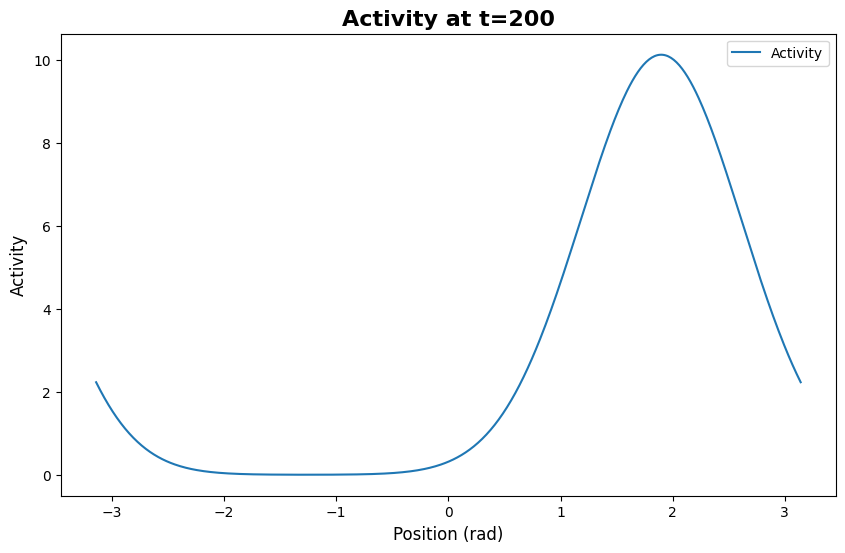

(<Figure size 1000x600 with 1 Axes>,
 <Axes: title={'center': 'Activity at t=200'}, xlabel='Position (rad)', ylabel='Activity'>)

In [ ]:
from canns.analyzer.plotting import PlotConfigs, energy_landscape_1d_static

# Configuration for static plot
config_static = PlotConfigs.energy_landscape_1d_static(
    time_steps_per_second=100,
    title='Activity at t=200',
    xlabel='Position (rad)',
    ylabel='Activity',
    save_path='snapshot_t200.png',
    show=True  # Display the plot
)

# Plot activity at specific time step (e.g., t=200)
energy_landscape_1d_static(
    data_sets={'Activity': (cann.x, us[200])},  # Single time step
    config=config_static
)

In [4]:
import brainpy.math as bm  # :cite:p:`wang2023brainpy`
from canns.models.basic import CANN1D, CANN1D_SFA  # SFA: :cite:p:`mi2014spike,li2025dynamics`
from canns.task.tracking import SmoothTracking1D
from canns.analyzer.plotting import PlotConfigs, energy_landscape_1d_animation

bm.set_dt(0.1)

# Create two models (auto-initialize)
cann_standard = CANN1D(num=512)
cann_sfa = CANN1D_SFA(num=512, tau_v=50.0)  # SFA with adaptation time constant

# Same task for both
task = SmoothTracking1D(
    cann_instance=cann_standard,  # Use one model as reference
    Iext=(1.0, 0.75, 2.0, 1.75, 3.0),
    duration=(10.0, 10.0, 10.0, 10.0),
    time_step=0.1,
)
task.get_data()

# Simulate standard CANN
def step_standard(t, inputs):
    cann_standard(inputs)
    return cann_standard.u.value

us_standard = bm.for_loop(
    step_standard,
    operands=(task.run_steps, task.data),
    progress_bar=10
)

# Simulate CANN-SFA
def step_sfa(t, inputs):
    cann_sfa(inputs)
    return cann_sfa.u.value

us_sfa = bm.for_loop(
    step_sfa,
    operands=(task.run_steps, task.data),
    progress_bar=10
)

# Visualize both in one animation
config_comparison = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=100,
    fps=20,
    title='CANN vs CANN-SFA: Oscillatory Tracking',
    xlabel='Position (rad)',
    ylabel='Activity',
    repeat=True,
    show=True,
)

energy_landscape_1d_animation(
    data_sets={
        'CANN (Standard)': (cann_standard.x, us_standard),
        'CANN-SFA': (cann_sfa.x, us_sfa),
        'Input': (cann_standard.x, task.data)
    },
    config=config_comparison
)

<SmoothTracking1D> Generating Task data: 400it [00:00, 9277.33it/s]


  0%|          | 0/400 [00:00<?, ?it/s]

  0%|          | 0/400 [00:00<?, ?it/s]

In [ ]:
config_slow = PlotConfigs.energy_landscape_1d_animation(
    time_steps_per_second=50,   # Show 50 steps per second (slower)
    fps=10,                     # 10 frames per second (smoother)
    ...
)

In [ ]:
config_styled = PlotConfigs.energy_landscape_1d_animation(
    figsize=(10, 4),            # Wider figure
    title='Custom Styled Plot',
    xlabel='Angular Position',
    ylabel='Firing Rate (Hz)',
    title_fontsize=14,
    save_path='styled_output.gif',
    show=False
)

In [ ]:
# Save only (for batch processing)
config_save = PlotConfigs.energy_landscape_1d_animation(
    save_path='output.gif',
    show=False
)

# Display only (for interactive exploration)
config_display = PlotConfigs.energy_landscape_1d_animation(
    save_path=None,
    show=True
)

# Both
config_both = PlotConfigs.energy_landscape_1d_animation(
    save_path='output.gif',
    show=True
)